## Before you start

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [1]:
!nvidia-smi

Tue Oct 15 10:53:20 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 545.23.06              Driver Version: 545.23.06    CUDA Version: 12.3     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 3090        On  | 00000000:01:00.0 Off |                  N/A |
|  0%   41C    P8              26W / 420W |   1491MiB / 24576MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
import os
HOME = os.getcwd()
print(HOME)

/home/joung/r12725056/CVDL/cvpdl_hw1_1008


## Environment setup

In [3]:
!pip install -i https://test.pypi.org/simple/ supervision==0.3.0
!pip install -q transformers
!pip install -q pytorch-lightning
!pip install -q roboflow
!pip install -q timm

In [4]:
import torch
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)

import roboflow
import supervision
import transformers
import pytorch_lightning

print(
    "roboflow:", roboflow.__version__,
    "; supervision:", supervision.__version__,
    "; transformers:", transformers.__version__,
    "; pytorch_lightning:", pytorch_lightning.__version__
)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Fri_Sep__8_19:17:24_PDT_2023
Cuda compilation tools, release 12.3, V12.3.52
Build cuda_12.3.r12.3/compiler.33281558_0
torch:  2.4 ; cuda:  cu121


IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


roboflow: 1.1.47 ; supervision: 0.3.0 ; transformers: 4.45.2 ; pytorch_lightning: 2.4.0


## Inference with pre-trained COCO model

### Load Model

In [5]:
import torch
from transformers import DetrForObjectDetection, DetrImageProcessor


# settings
DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
CHECKPOINT = 'facebook/detr-resnet-101'
CONFIDENCE_TRESHOLD = 0.5
IOU_TRESHOLD = 0.8

image_processor = DetrImageProcessor.from_pretrained(CHECKPOINT)
model = DetrForObjectDetection.from_pretrained(CHECKPOINT)
model.to(DEVICE)

Some weights of the model checkpoint at facebook/detr-resnet-101 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


DetrForObjectDetection(
  (model): DetrModel(
    (backbone): DetrConvModel(
      (conv_encoder): DetrConvEncoder(
        (model): FeatureListNet(
          (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
          (bn1): DetrFrozenBatchNorm2d()
          (act1): ReLU(inplace=True)
          (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
          (layer1): Sequential(
            (0): Bottleneck(
              (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn1): DetrFrozenBatchNorm2d()
              (act1): ReLU(inplace=True)
              (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (bn2): DetrFrozenBatchNorm2d()
              (drop_block): Identity()
              (act2): ReLU(inplace=True)
              (aa): Identity()
              (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      

### Create coco annotation file

In [6]:
import json
import cv2
import os

# Initialize COCO format structure
coco_data = {
    "images": [],
    "annotations": [],
    "categories": [
        {"id": 0, "name": "Person"},
        {"id": 1, "name": "Ear"},
        {"id": 2, "name": "Earmuffs"},
        {"id": 3, "name": "Face"},
        {"id": 4, "name": "Face-guard"},
        {"id": 5, "name": "Face-mask-medical"},
        {"id": 6, "name": "Foot"},
        {"id": 7, "name": "Tools"},
        {"id": 8, "name": "Glasses"},
        {"id": 9, "name": "Gloves"},
        {"id": 10, "name": "Helmet"},
        {"id": 11, "name": "Hands"},
        {"id": 12, "name": "Head"},
        {"id": 13, "name": "Medical-suit"},
        {"id": 14, "name": "Shoes"},
        {"id": 15, "name": "Safety-suit"},
        {"id": 16, "name": "Safety-vest"}
    ]
}

def convert_to_coco_format(image_dir, label_dir):
    annotation_id = 1
    total_images = len(os.listdir(image_dir))
    
    for idx, image_name in enumerate(os.listdir(image_dir)):
        image_id = idx + 1
        image_name = image_name.strip()
        # Read image
        image_path = os.path.join(image_dir, image_name)
        image = cv2.imread(image_path)
        
        if image is None:
            print(f"Warning: Unable to read image {image_name}")
            continue
        
        height, width, _ = image.shape

        # Add image info
        coco_data["images"].append({
            "id": image_id,
            "file_name": image_name,
            "height": height,
            "width": width
        })

        # Check label file (with multiple extension possibilities)
        label_path = os.path.join(label_dir, image_name.replace(".jpeg", ".txt").replace(".jpg", ".txt").replace(".png", ".txt"))
        
        # Ensure the label file exists before reading it
        if not os.path.exists(label_path):
            print(f"Label not found for {image_name}, skipping...")
            continue

        with open(label_path, "r") as label_file:
            for line in label_file:
                # Clean and map label data
                class_id, x_center, y_center, bbox_width, bbox_height = map(float, line.split())

                # Convert to COCO bounding box format
                x_min = (x_center - bbox_width / 2) * width
                y_min = (y_center - bbox_height / 2) * height
                bbox_width = bbox_width * width
                bbox_height = bbox_height * height

                # Add annotation
                coco_data["annotations"].append({
                    "id": annotation_id,
                    "image_id": image_id,
                    "category_id": int(class_id),
                    "bbox": [x_min, y_min, bbox_width, bbox_height],
                    "area": bbox_width * bbox_height,
                    "iscrowd": 0
                })
                annotation_id += 1
        
        # Print progress
        print(f"Processing {image_name} ({idx + 1}/{total_images})")

In [7]:
# Convert data
convert_to_coco_format("train/images", "train/labels")

# Write the result to a JSON file
with open("train/train_annotations_coco.json", "w") as f:
    json.dump(coco_data, f)

In [8]:
# 定義驗證集的路徑
validation_image_dir = "valid/images"
validation_label_dir = "valid/labels"

# 轉換驗證集
convert_to_coco_format(validation_image_dir, validation_label_dir)

# 將驗證集結果寫入 JSON 檔案
with open("valid/valid_annotations_coco.json", "w") as f:
    json.dump(coco_data, f)

In [9]:
test_image_dir = "test/images"  

image_id = 1
for filename in os.listdir(test_image_dir):
    if filename.endswith(".jpg") or filename.endswith(".jpeg") or filename.endswith(".png"):
        image_path = os.path.join(test_image_dir, filename)
        image = cv2.imread(image_path)
        if image is None:
            print(f"Warning: Unable to read image {filename}")
            continue
        height, width, _ = image.shape
        coco_data["images"].append({
            "id": image_id,
            "file_name": filename,
            "height": height,
            "width": width
        })
        image_id += 1

with open('test/test_annotations_coco.json', 'w') as f:
    json.dump(coco_data, f, indent=4)

## Create COCO data loaders

In [7]:
import os
import torchvision

ANNOTATION_FILE_NAME_TRAIN = "train_annotations_coco.json"
ANNOTATION_FILE_NAME_VALID = "valid_annotations_coco.json"
ANNOTATION_FILE_NAME_TEST = "test_annotations_coco.json"

TRAIN_DIRECTORY = "train"
VALID_DIRECTORY = "valid"
TEST_DIRECTORY = "test"

class CocoDetection(torchvision.datasets.CocoDetection):
    def __init__(
        self,
        image_directory_path: str,
        annotation_file: str,
        image_processor,
        train: bool = True
    ):
        annotation_file_path = os.path.join(image_directory_path, annotation_file)
        image_directory_path = os.path.join(image_directory_path, "images")
        super(CocoDetection, self).__init__(image_directory_path, annotation_file_path)
        self.image_processor = image_processor

    def __getitem__(self, idx):
        images, annotations = super(CocoDetection, self).__getitem__(idx)
        image_id = self.ids[idx]
        annotations = {'image_id': image_id, 'annotations': annotations}
        encoding = self.image_processor(images=images, annotations=annotations, return_tensors="pt")
        pixel_values = encoding["pixel_values"].squeeze()
        target = encoding["labels"][0]

        return pixel_values, target

from transformers import DetrImageProcessor
image_processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50")

TRAIN_DATASET = CocoDetection(
    image_directory_path=TRAIN_DIRECTORY,
    annotation_file=ANNOTATION_FILE_NAME_TRAIN,
    image_processor=image_processor,
    train=True)
VAL_DATASET = CocoDetection(
    image_directory_path=VALID_DIRECTORY,
    annotation_file=ANNOTATION_FILE_NAME_VALID,
    image_processor=image_processor,
    train=False)
TEST_DATASET = CocoDetection(
    image_directory_path=TEST_DIRECTORY,
    annotation_file=ANNOTATION_FILE_NAME_TEST,
    image_processor=image_processor,
    train=False
)

print("Number of training examples:", len(TRAIN_DATASET))
print("Number of validation examples:", len(VAL_DATASET))
print("Number of test examples:", len(TEST_DATASET))

loading annotations into memory...
Done (t=0.16s)
creating index...
index created!
loading annotations into memory...
Done (t=0.04s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Number of training examples: 4319
Number of validation examples: 2160
Number of test examples: 1620


## Visualize data entry

**NOTE:** Feel free to reload this cell multiple times. Notebook should display different train set image each time.

Image #2344


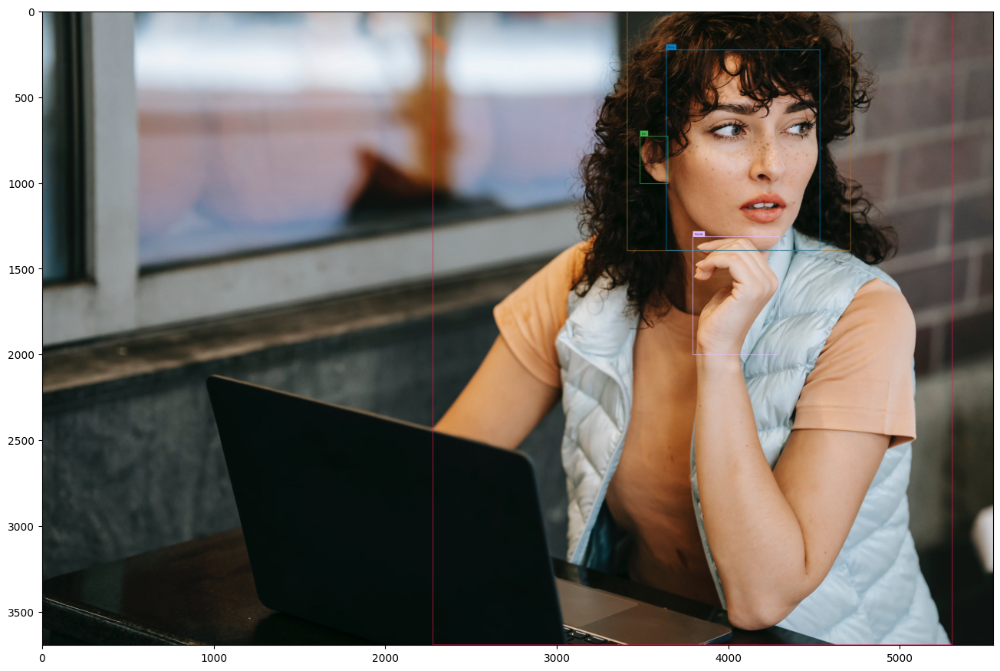

In [11]:
import supervision as sv
import random
import cv2
import numpy as np


# select random image
image_ids = TRAIN_DATASET.coco.getImgIds()
image_id = random.choice(image_ids)
print('Image #{}'.format(image_id))

# load image and annotatons
image = TRAIN_DATASET.coco.loadImgs(image_id)[0]
annotations = TRAIN_DATASET.coco.imgToAnns[image_id]
image_path = os.path.join(TRAIN_DATASET.root, image['file_name'])
image = cv2.imread(image_path)

# annotate
detections = sv.Detections.from_coco_annotations(coco_annotation=annotations)

# we will use id2label function for training
categories = TRAIN_DATASET.coco.cats
id2label = {k: v['name'] for k,v in categories.items()}

labels = [
    f"{id2label[class_id]}"
    for _, _, class_id, _
    in detections
]

box_annotator = sv.BoxAnnotator()
frame = box_annotator.annotate(scene=image, detections=detections, labels=labels)

%matplotlib inline
sv.show_frame_in_notebook(image, (16, 16))

In [8]:
from torch.utils.data import DataLoader

def collate_fn(batch):
    # DETR authors employ various image sizes during training, making it not possible
    # to directly batch together images. Hence they pad the images to the biggest
    # resolution in a given batch, and create a corresponding binary pixel_mask
    # which indicates which pixels are real/which are padding
    pixel_values = [item[0] for item in batch]
    encoding = image_processor.pad(pixel_values, return_tensors="pt")
    labels = [item[1] for item in batch]
    return {
        'pixel_values': encoding['pixel_values'],
        'pixel_mask': encoding['pixel_mask'],
        'labels': labels
    }

TRAIN_DATALOADER = DataLoader(dataset=TRAIN_DATASET, collate_fn=collate_fn, batch_size=6, shuffle=True, num_workers=4)
VAL_DATALOADER = DataLoader(dataset=VAL_DATASET, collate_fn=collate_fn, batch_size=6, num_workers=4)
TEST_DATALOADER = DataLoader(dataset=TEST_DATASET, collate_fn=collate_fn, batch_size=6)

## Train model with PyTorch Lightning

**NOTE:** Here we define a regular PyTorch dataset. Each item of the dataset is an image and corresponding annotations. Torchvision already provides a `CocoDetection` dataset, which we can use. We only add a feature extractor (`DetrImageProcessor`) to resize + normalize the images, and to turn the annotations (which are in COCO format) in the format that DETR expects. It will also resize the annotations accordingly.

In [9]:
import pytorch_lightning as pl
from transformers import DetrForObjectDetection
import torch


class Detr(pl.LightningModule):

    def __init__(self, lr, lr_backbone, weight_decay):
        super().__init__()
        self.model = DetrForObjectDetection.from_pretrained(
            pretrained_model_name_or_path=CHECKPOINT,
            num_labels=17,
            ignore_mismatched_sizes=True
        )

        self.lr = lr
        self.lr_backbone = lr_backbone
        self.weight_decay = weight_decay

    def forward(self, pixel_values, pixel_mask):
        return self.model(pixel_values=pixel_values, pixel_mask=pixel_mask)

    def common_step(self, batch, batch_idx):
        pixel_values = batch["pixel_values"]
        pixel_mask = batch["pixel_mask"]
        labels = [{k: v.to(self.device) for k, v in t.items()} for t in batch["labels"]]

        outputs = self.model(pixel_values=pixel_values, pixel_mask=pixel_mask, labels=labels)

        loss = outputs.loss
        loss_dict = outputs.loss_dict

        return loss, loss_dict

    def training_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)
        # logs metrics for each training_step, and the average across the epoch
        self.log("training_loss", loss)
        for k,v in loss_dict.items():
            self.log("train_" + k, v.item())

        return loss

    def validation_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)
        self.log("validation/loss", loss)
        for k, v in loss_dict.items():
            self.log("validation_" + k, v.item())

        return loss

    def configure_optimizers(self):
        # DETR authors decided to use different learning rate for backbone
        # you can learn more about it here:
        # - https://github.com/facebookresearch/detr/blob/3af9fa878e73b6894ce3596450a8d9b89d918ca9/main.py#L22-L23
        # - https://github.com/facebookresearch/detr/blob/3af9fa878e73b6894ce3596450a8d9b89d918ca9/main.py#L131-L139
        param_dicts = [
            {
                "params": [p for n, p in self.named_parameters() if "backbone" not in n and p.requires_grad]},
            {
                "params": [p for n, p in self.named_parameters() if "backbone" in n and p.requires_grad],
                "lr": self.lr_backbone,
            },
        ]
        return torch.optim.AdamW(param_dicts, lr=self.lr, weight_decay=self.weight_decay)

    def train_dataloader(self):
        return TRAIN_DATALOADER

    def val_dataloader(self):
        return VAL_DATALOADER
    
    def test_dataloader(self):
        return TEST_DATALOADER

**NOTE:** Let's start `tensorboard`.

In [10]:
%cd {HOME}

%load_ext tensorboard
%tensorboard --logdir lightning_logs/

/home/joung/r12725056/CVDL/cvpdl_hw1_1008


This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.


Reusing TensorBoard on port 6006 (pid 510125), started 3 days, 16:24:41 ago. (Use '!kill 510125' to kill it.)

In [11]:
model = Detr(lr=1e-4, lr_backbone=1e-5, weight_decay=1e-4)

batch = next(iter(TRAIN_DATALOADER))
outputs = model(pixel_values=batch['pixel_values'], pixel_mask=batch['pixel_mask'])

Some weights of the model checkpoint at facebook/detr-resnet-101 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DetrForObjectDetection were not initialized from the model checkpoi

In [17]:
outputs.logits.shape

torch.Size([6, 100, 18])

In [12]:
from pytorch_lightning import Trainer

%cd {HOME}

# settings
MAX_EPOCHS = 60

# pytorch_lightning < 2.0.0
# trainer = Trainer(gpus=1, max_epochs=MAX_EPOCHS, gradient_clip_val=0.1, accumulate_grad_batches=8, log_every_n_steps=5)

# pytorch_lightning >= 2.0.0
trainer = Trainer(devices=1, accelerator="gpu", max_epochs=MAX_EPOCHS, gradient_clip_val=0.1, accumulate_grad_batches=8, log_every_n_steps=5)

trainer.fit(model)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/home/joung/r12725056/CVDL/cvpdl_hw1_1008


In [13]:
best_model_path = trainer.checkpoint_callback.best_model_path
# best_model_path = 'lightning_logs/version_7/checkpoints/epoch=59-step=5400.ckpt'
model = Detr.load_from_checkpoint(best_model_path,    
    lr=1e-4,  # Example values, adjust as needed
    lr_backbone=1e-5,
    weight_decay=1e-4)

Some weights of the model checkpoint at facebook/detr-resnet-101 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DetrForObjectDetection were not initialized from the model checkpoi

In [14]:
print("Best model path:", best_model_path)

Best model path: lightning_logs/version_7/checkpoints/epoch=59-step=5400.ckpt


### Predict on validation set

In [23]:
import json
import os

def prepare_predictions_for_coco(predictions, dataset):
    results = {}
    for image_id, prediction in predictions.items():
        if len(prediction['boxes']) == 0:
            continue

        # get the image files name from COCO dataset
        image_info = dataset.coco.loadImgs(image_id)[0]
        image_file_name = image_info['file_name']

        # prepare boxes and labels
        boxes = prediction['boxes']
        labels = prediction['labels']

        # prepare the results
        results[image_file_name] = {
            "boxes": boxes.tolist(),
            "labels": [label.item() for label in labels]
        }

    return results

def save_predictions_to_json_file(dataloader, model, processor, output_file, dataset):
    model.eval()
    eval_predictions = {}

    i = 0
    with torch.no_grad():
        for batch in dataloader:
            i += 1
            print(i)
            pixel_values = batch["pixel_values"].to(DEVICE)
            pixel_mask = batch["pixel_mask"].to(DEVICE)
            labels = [{k: v.to(DEVICE) for k, v in t.items()} for t in batch["labels"]]

            outputs = model(pixel_values=pixel_values, pixel_mask=pixel_mask)
            target_sizes = torch.stack([target["orig_size"] for target in labels], dim=0)
            results_batch = processor.post_process_object_detection(outputs, target_sizes=target_sizes)

            for idx, result in enumerate(results_batch):
                image_id = labels[idx]["image_id"].item()
                eval_predictions[image_id] = {
                    "boxes": result["boxes"],
                    "scores": result["scores"],
                    "labels": result["labels"]
                }
    
    custom_format_results = prepare_predictions_for_coco(eval_predictions, dataset)
    with open(output_file, 'w') as f:
        json.dump(custom_format_results, f)


In [21]:
save_predictions_to_json_file(VAL_DATALOADER, model, image_processor, "valid/valid_predictions_resnet101.json", VAL_DATASET)

The `max_size` parameter is deprecated and will be removed in v4.26. Please specify in `size['longest_edge'] instead`.
The `max_size` parameter is deprecated and will be removed in v4.26. Please specify in `size['longest_edge'] instead`.
The `max_size` parameter is deprecated and will be removed in v4.26. Please specify in `size['longest_edge'] instead`.
The `max_size` parameter is deprecated and will be removed in v4.26. Please specify in `size['longest_edge'] instead`.


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


In [22]:
save_predictions_to_json_file(TEST_DATALOADER, model, image_processor, "test/test_predictions_resnet101.json", TEST_DATASET)

The `max_size` parameter is deprecated and will be removed in v4.26. Please specify in `size['longest_edge'] instead`.


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270


Image #625
detections


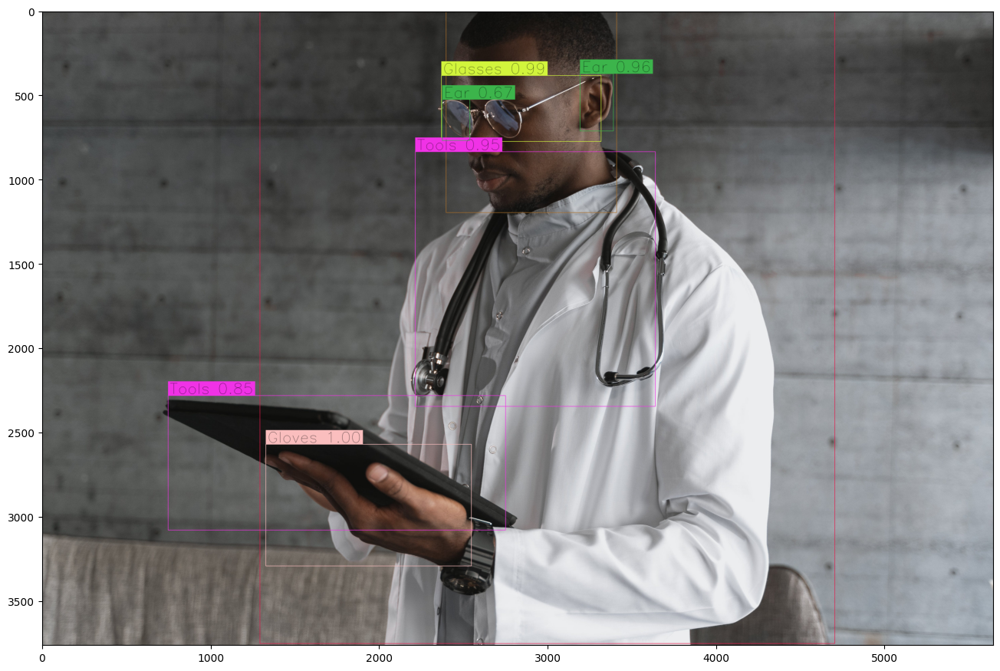

In [37]:
import random
import cv2
import numpy as np

# utils
categories = TEST_DATASET.coco.cats
id2label = {k: v['name'] for k,v in categories.items()}
box_annotator = sv.BoxAnnotator()

# select random image
image_ids = TEST_DATASET.coco.getImgIds()
image_id = random.choice(image_ids)
print('Image #{}'.format(image_id))

# load image and annotatons
image = TEST_DATASET.coco.loadImgs(image_id)[0]
annotations = TEST_DATASET.coco.imgToAnns[image_id]
image_path = os.path.join(TEST_DATASET.root, image['file_name'])
image = cv2.imread(image_path)

# inference
with torch.no_grad():

    # load image and predict
    inputs = image_processor(images=image, return_tensors='pt').to(DEVICE)
    outputs = model(**inputs)

    # post-process
    target_sizes = torch.tensor([image.shape[:2]]).to(DEVICE)
    results = image_processor.post_process_object_detection(
        outputs=outputs,
        threshold=CONFIDENCE_TRESHOLD,
        target_sizes=target_sizes
    )[0]

# annotate
detections = sv.Detections.from_transformers(transformers_results=results).with_nms(threshold=0.5)
labels = [f"{id2label[class_id]} {confidence:.2f}" for _, confidence, class_id, _ in detections]
box_annotator = sv.BoxAnnotator(text_scale=3)  
frame = box_annotator.annotate(scene=image.copy(), detections=detections, labels=labels)

print('detections')
%matplotlib inline
sv.show_frame_in_notebook(frame, (16, 16))

## Save and load model

In [38]:
MODEL_PATH = os.path.join(HOME, 'custom-model')

In [39]:
model.model.save_pretrained(MODEL_PATH)

In [40]:
model = DetrForObjectDetection.from_pretrained(MODEL_PATH)
model.to(DEVICE)

DetrForObjectDetection(
  (model): DetrModel(
    (backbone): DetrConvModel(
      (conv_encoder): DetrConvEncoder(
        (model): FeatureListNet(
          (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
          (bn1): DetrFrozenBatchNorm2d()
          (act1): ReLU(inplace=True)
          (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
          (layer1): Sequential(
            (0): Bottleneck(
              (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn1): DetrFrozenBatchNorm2d()
              (act1): ReLU(inplace=True)
              (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (bn2): DetrFrozenBatchNorm2d()
              (drop_block): Identity()
              (act2): ReLU(inplace=True)
              (aa): Identity()
              (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      

### Discussion

category_counts: Counter({11: 4009, 0: 3587, 12: 2672, 1: 2122, 3: 2046, 7: 1624, 14: 1098, 9: 678, 8: 600, 10: 286, 6: 209, 5: 145, 16: 93, 15: 84, 2: 51, 13: 31, 4: 14})


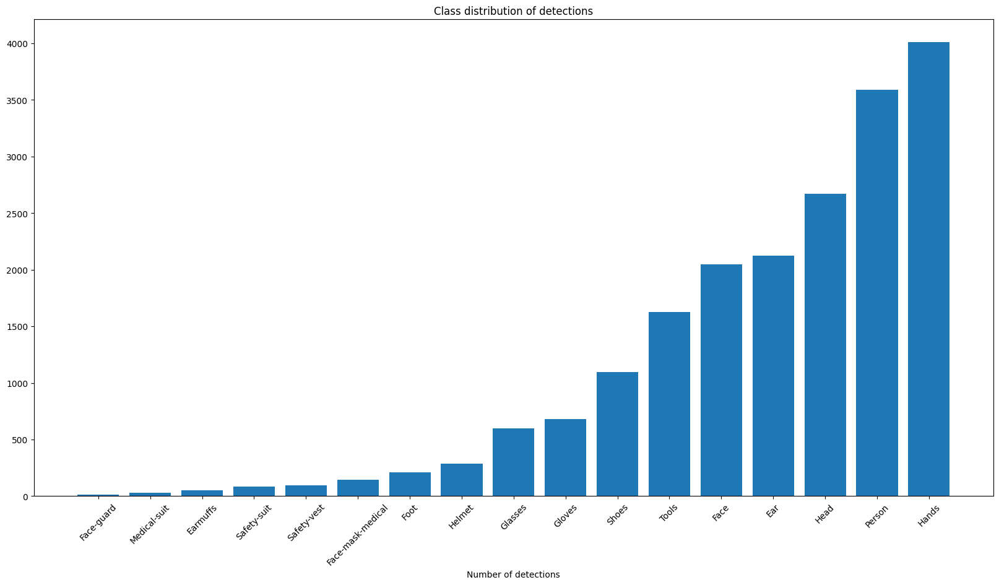

In [29]:
import json
from collections import Counter
import matplotlib.pyplot as plt

with open('test/test_predictions_resnet101.json', 'r') as f:
    test_predictions = json.load(f)

category_counts = Counter()

for image_id, detection in test_predictions.items():
    labels =  detection['labels']
    category_counts.update(labels)

print('category_counts:', category_counts)

# sort  category_counts by category values
category_counts = dict(sorted(category_counts.items(), key=lambda item: item[1]))

id2label = {k: v['name'] for k,v in TEST_DATASET.coco.cats.items()}

labels = [id2label[k] for k in category_counts.keys()]
counts = list(category_counts.values())

plt.figure(figsize=(20, 10))
plt.bar(labels, counts)
plt.xticks(rotation=45)
plt.xlabel('Number of detections')
plt.title('Class distribution of detections')
plt.show()

category_counts: {4: 74, 13: 83, 15: 125, 2: 189, 16: 302, 5: 350, 6: 399, 10: 522, 8: 1033, 9: 1509, 14: 2347, 7: 2469, 1: 4038, 3: 4696, 12: 6335, 0: 7392, 11: 8437}


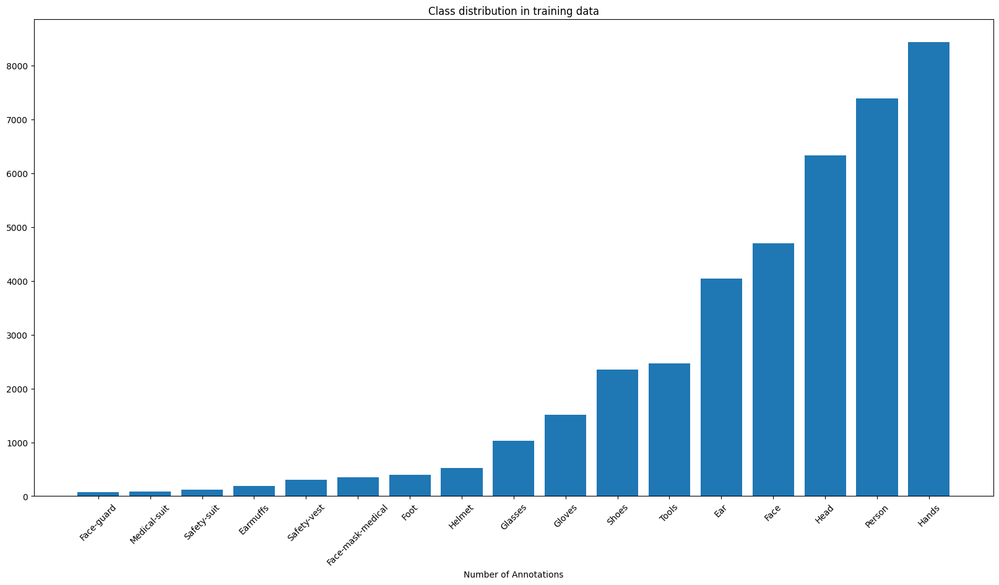

In [27]:
import json
from collections import Counter
import matplotlib.pyplot as plt

with open('train/train_annotations_coco.json', 'r') as f:
    train_data = json.load(f)

category_counts = Counter()

for annotation in train_data['annotations']:
    category_id = annotation['category_id']
    category_counts[category_id] += 1

category_counts = dict(sorted(category_counts.items(), key=lambda item: item[1], reverse = False))
print('category_counts:', category_counts)

id2label = {k['id']: k['name'] for k in train_data['categories']}

labels = [id2label[k] for k in category_counts.keys()]
counts = list(category_counts.values())

plt.figure(figsize=(20, 10))
plt.bar(labels, counts)
plt.xticks(rotation=45)
plt.xlabel('Number of Annotations')
plt.title('Class distribution in training data')
plt.show()